In [1]:
!pip install opencv-python
!pip install opencv-contrib-python

In [2]:
!pip install imutils

In [3]:
import matplotlib.pyplot as plt
import os, sys
from osgeo import gdal, gdalconst
import numpy as np
from tqdm import tqdm_notebook
import colorsys
import pandas as pd

In [4]:
# import the necessary packages
from skimage import exposure
import numpy as np
import argparse
import imutils
import cv2
from PIL import Image
# construct the argument parser and parse the arguments
ap = argparse.ArgumentParser()
ap.add_argument("-q", "--query", required = True,help = "Path to the query image")

_StoreAction(option_strings=['-q', '--query'], dest='query', nargs=None, const=None, default=None, type=None, choices=None, help='Path to the query image', metavar=None)

In [5]:
list_images = os.listdir('../input/roscosmos-rucode/Images_composit/Images_composit/8_ch')
list_masks = os.listdir('../input/roscosmos-rucode/mask/mask')

In [6]:
mean=[0.485, 0.456, 0.406]
std=[0.229, 0.224, 0.225]

In [7]:
list(set(list_images) & set(list_masks))

['KV1_20170922_SCN9_UN9__KV5_20190912_SCN9_UN10.tif',
 'KV1_20170922_SCN7_UN19__KV5_20190912_SCN7_UN20.tif',
 'KV1_20170922_SCN8_UN21__KV5_20190912_SCN8_UN22.tif',
 'KV1_20170922_SCN11_UN13__KV5_20190912_SCN11_UN14.tif',
 'KV1_20170922_SCN9_UN23__KV5_20190912_SCN9_UN24.tif']

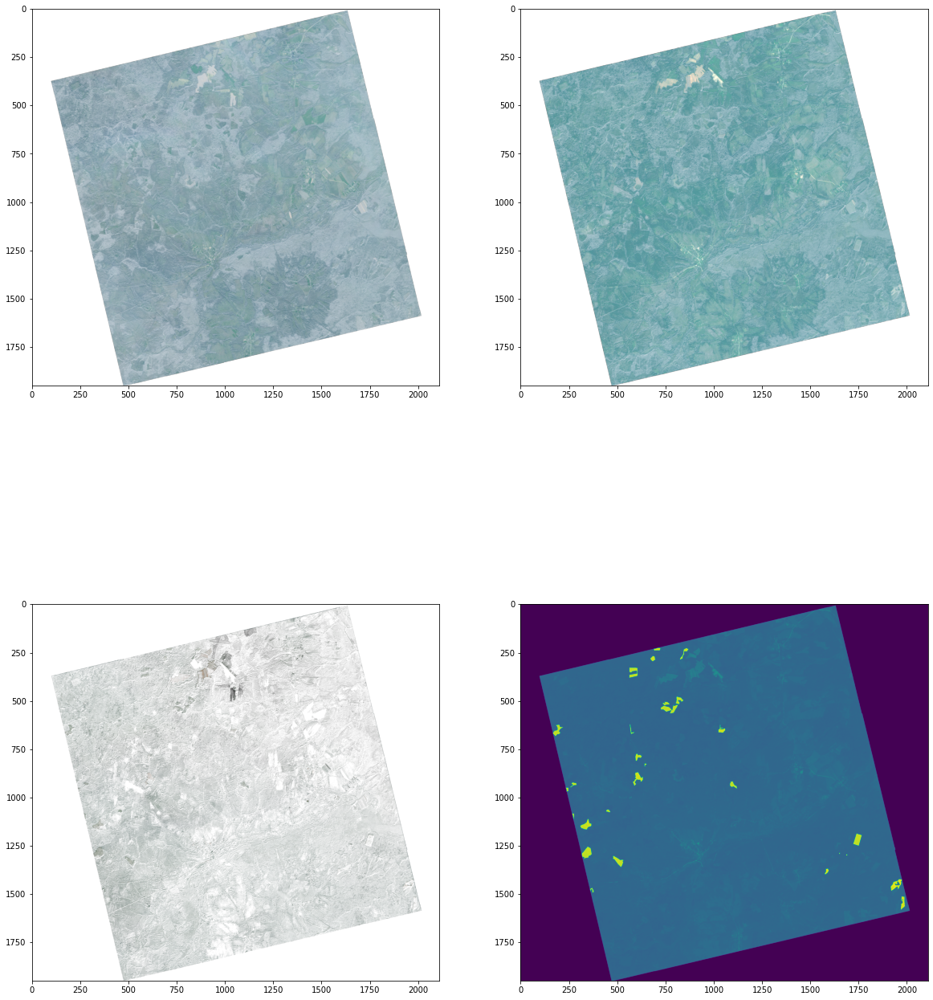

In [8]:
fig=plt.figure(figsize=(20, 25))
two_images = gdal.Open(f'../input/roscosmos-rucode/Images_composit/Images_composit/8_ch/KV1_20170922_SCN11_UN13__KV5_20190912_SCN11_UN14.tif', gdalconst.GA_ReadOnly)
channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(1,5)])
img_rgb_1 = (np.moveaxis(channel_rgb1, 0, -1)/1024)
fig.add_subplot(2, 2, 1)
plt.imshow(img_rgb_1)#[1100:1400,1500:2000]

channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(5,9)])
img_rgb_2 = (np.moveaxis(channel_rgb1, 0, -1)/1024)
fig.add_subplot(2, 2, 2)
plt.imshow(img_rgb_2)

mask = gdal.Open(f'../input/roscosmos-rucode/mask/mask/KV1_20170922_SCN11_UN13__KV5_20190912_SCN11_UN14.tif', gdalconst.GA_ReadOnly)
fig.add_subplot(2, 2, 3)
plt.imshow((img_rgb_2-img_rgb_1))

fig.add_subplot(2, 2, 4)
plt.imshow(img_rgb_2[:,:,2]+ mask.GetRasterBand(1).ReadAsArray())
plt.show()

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import skimage.data as data
import skimage.segmentation as seg
import skimage.filters as filters
import skimage.draw as draw
import skimage.color as color

In [10]:
def decode_mask(mask):
    pixels = mask.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

In [11]:
df = pd.read_csv('../input/roscosmos-rucode/sample_submission.csv')

In [12]:
array_of_threshold = [0.14,0.02,0.1,1e-09,0.55,0.08,0.05,0.4,0.36,0.0001,0.07,0.05,1e-05,1e-08,0.22,0.03,0.1,0.0,0.35,0.4,0.06,0.001,0.08,0.08,0.09,0.06,0.5,0.1,0.001,0.15,0.0,0.08,0.28,0.35,0.0,0.08,0.52,0.1,0.1,0.0,0.0]

In [13]:
list_names_images = ['KV1_20170922_SCN10_UN11__KV5_20190912_SCN10_UN12.tif',
 'KVI_20180606_SCN2_UN59__KV5_20190805_SCN2_UN60.tif',
 'KVI_20180922_SCN4_UN93__KV1_20190804_SCN2_UN94.tif',
 'KVI_20180922_SCN3_UN91__KV1_20190804_SCN2_UN92.tif',
 'KV1_20180615_SCN5_UN41__KVI_20190805_SCN5_UN42.tif',
 'KVI_20180606_SCN3_UN61__KV5_20190805_SCN3_UN62.tif',
 'KVI_20180618_SCN15_UN73__KV6_20190530_SCN8_UN74.tif',
 'KV1_20180615_SCN4_UN37__KV3_20200522_SCN4_UN38.tif',
 'KV1_20180615_SCN6_UN43__KV5_20190625_SCN5_UN44.tif',
 'KVI_20180606_SCN6_UN65__KV5_20190805_SCN6_UN66.tif',
 'KV1_20170527_SCN18_UN1__KV5_20190908_SCN6_UN2.tif',
 'KV6_20190609_SCN4_UN55__KV6_20200608_SCN3_UN56.tif',
 'KVI_20180921_SCN9_UN89__KV4_20190622_SCN9_UN90.tif',
 'KVI_20180921_SCN8_UN87__KV4_20190622_SCN8_UN88.tif',
 'KV1_20170922_SCN3_UN7__KV5_20190912_SCN3_UN8.tif',
 'KV6_20190609_SCN3_UN53__KV6_20200608_SCN3_UN54.tif',
 'KVI_20180618_SCN16_UN75__KV6_20190530_SCN9_UN76.tif',
 'KV1_20180810_SCN10_UN45__KV5_20200914_SCN10_UN46.tif',
 'KV4_20190629_SCN3_UN51__KV5_20200521_SCN3_UN52.tif',
 'KV1_20180615_SCN9_UN39__KV3_20200522_SCN9_UN40.tif',
 'KV1_20180602_SCN17_UN31__KV5_20200901_SCN17_UN32.tif',
 'KVI_20180920_SCN3_UN81__KV4_20190609_SCN3_UN82.tif',
 'KV1_20180602_SCN16_UN29__KV5_20200901_SCN16_UN30.tif',
 'KVI_20180921_SCN5_UN85__KV4_20190622_SCN5_UN86.tif',
 'KV6_20190704_SCN2_UN57__KV5_20200521_SCN10_UN58.tif',
 'KVI_20180606_SCN4_UN63__KV5_20190805_SCN4_UN64.tif',
 'KV1_20170527_SCN25_UN3__KV4_20190530_SCN25_UN4.tif',
 'KV1_20180603_SCN10_UN33__KV6_20190622_SCN9_UN34.tif',
 'KVI_20180606_SCN9_UN67__KV5_20190719_SCN9_UN68.tif',
 'KVI_20180805_SCN4_UN79__KV1_20190726_SCN5_UN80.tif',
 'KV3_20180702_SCN2_UN49__KV4_20200829_SCN2_UN50.tif',
 'KV1_20180501_SCN6_UN25__KV6_20190704_SCN2_UN26.tif',
 'KV1_20170922_SCN5_UN17__KV5_20190912_SCN4_UN18.tif',
 'KV1_20170527_SCN26_UN5__KV4_20190530_SCN26_UN6.tif',
 'KVI_20180606_SCN10_UN69__KV5_20190719_SCN10_UN70.tif',
 'KVI_20180921_SCN13_UN83__KV4_20190622_SCN13_UN84.tif',
 'KV1_20180615_SCN1_UN35__KVI_20190805_SCN2_UN36.tif',
 'KV1_20180602_SCN14_UN27__KV5_20200901_SCN14_UN28.tif',
 'KVI_20180624_SCN11_UN77__KV3_20190830_SCN23_UN78.tif',
 'KVI_20180606_SCN11_UN71__KV5_20190719_SCN11_UN72.tif',
 'KV3_20180702_SCN2_UN47__KV4_20200829_SCN1_UN48.tif']

In [14]:
channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(1,5)])
img_rgb_1 = (np.moveaxis(channel_rgb1, 0, -1))
channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(5,9)])
img_rgb_2 = (np.moveaxis(channel_rgb1, 0, -1))

img1_norm = (img_rgb_1 - np.mean(img_rgb_1))/np.std(img_rgb_1)
img2_norm = (img_rgb_2 - np.mean(img_rgb_2))/np.std(img_rgb_2)

img1_gray = 0.299*img1_norm[:,:,0] + 0.587*img1_norm[:,:,1] + 0.114*img1_norm[:,:,2]
img2_gray = 0.299*img2_norm[:,:,0] + 0.587*img2_norm[:,:,1] + 0.114*img2_norm[:,:,2]

image = (img2_gray - img1_gray)

In [ ]:
channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(1,5)])
img_rgb_1 = (np.moveaxis(channel_rgb1, 0, -1))
channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(5,9)])
img_rgb_2 = (np.moveaxis(channel_rgb1, 0, -1))

# img1_gray = 0.299*img_rgb_1[:,:,0] + 0.587*img_rgb_1[:,:,1] + 0.114*img_rgb_1[:,:,2]
# img2_gray = 0.299*img_rgb_2[:,:,0] + 0.587*img_rgb_2[:,:,1] + 0.114*img_rgb_2[:,:,2]

img1_norm = (img_rgb_1 - np.mean(img_rgb_1))/np.std(img_rgb_1)
img2_norm = (img_rgb_2 - np.mean(img_rgb_2))/np.std(img_rgb_2)

image = (img2_norm - img1_norm)

In [ ]:
image = [[img[i,j]/img1_norm[i,j] if img1_norm[i,j]!=0 else img[i,j] for j in range(img1_norm.shape[1])] for i in range(img1_norm.shape[0])]

In [ ]:
[1245:1270,1730:1760]

In [ ]:
fig,ax = plt.subplots(figsize = (10,15))
plt.imshow(img1_norm)

In [ ]:
fig,ax = plt.subplots(figsize = (10,15))
plt.imshow(img2_norm)

In [ ]:
fig,ax = plt.subplots(figsize = (10,15))
plt.imshow(img1_norm[250:300,860:900])

In [ ]:
fig,ax = plt.subplots(figsize = (10,15))
plt.imshow(img2_norm[250:300,860:900])

In [ ]:
img_rgb_1[270,870], img_rgb_2[270,870]

In [ ]:
img1_norm[270,870], img2_norm[270,870]

In [ ]:
img_rgb_1[1245,1746], img_rgb_2[1245,1746]

In [ ]:
img1_norm[1245,1746], img2_norm[1245,1746]

In [ ]:
fig,ax = plt.subplots(figsize = (10,15))
plt.imshow(img2_norm[1245:1270,1730:1760])

In [ ]:
fig,ax = plt.subplots(figsize = (10,15))
plt.imshow(mask.GetRasterBand(1).ReadAsArray()[1245:1270,1730:1760])

# Make data dirs

In [15]:
#Making dataset files
#
array_of_images = []
array_of_masks = []
for name in list(set(list_images) & set(list_masks)):
    two_images = gdal.Open(f'../input/roscosmos-rucode/Images_composit/Images_composit/8_ch/{name}', gdalconst.GA_ReadOnly)
    
    #Preprocess and grayscale image
    
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(1,5)])
    img_rgb_1 = (np.moveaxis(channel_rgb1, 0, -1))
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(5,9)])
    img_rgb_2 = (np.moveaxis(channel_rgb1, 0, -1))
    img1_gray = 0.299*img_rgb_1[:,:,0] + 0.587*img_rgb_1[:,:,1] + 0.114*img_rgb_1[:,:,2]
    img2_gray = 0.299*img_rgb_2[:,:,0] + 0.587*img_rgb_2[:,:,1] + 0.114*img_rgb_2[:,:,2]
    
    img1_norm = (img1_gray - np.mean(img1_gray))/np.std(img1_gray)
    img2_norm = (img2_gray - np.mean(img2_gray))/np.std(img2_gray)

    image = (img2_norm - img1_norm)
    
    mask = gdal.Open(f'../input/roscosmos-rucode/mask/mask/{name}', gdalconst.GA_ReadOnly)
    
    #Extract our images
    mask = mask.GetRasterBand(1).ReadAsArray()
    #Cropp image to plenty of images with normal ground truth and save it to dataset folders
#     for i in tqdm_notebook(range(IMG_SIZE, image.shape[0], IMG_SIZE)):
#         for j in range(IMG_SIZE, image.shape[1], IMG_SIZE):
#             if mask[i-IMG_SIZE:i, j-IMG_SIZE:j].sum()>0:
#                 array_of_images.append(image[i-IMG_SIZE:i, j-IMG_SIZE:j])
#                 array_of_masks.append(mask[i-IMG_SIZE:i, j-IMG_SIZE:j])
    
#     array_of_images_21.append(img2_norm - img1_norm)
#     array_of_images_12.append(img1_norm - img2_norm)
    array_of_images.append(image)
    array_of_masks.append(mask)

In [38]:
#Making dataset files
#
array_of_images_s = []
array_of_masks_s = []
for name in list(set(list_images) & set(list_masks)):
    two_images = gdal.Open(f'../input/roscosmos-rucode/Images_composit/Images_composit/8_ch/{name}', gdalconst.GA_ReadOnly)
    
    #Preprocess and grayscale image
    
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(1,4)])
    img_rgb_1 = np.moveaxis(channel_rgb1, 0, -1)/1024
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(5,8)])
    img_rgb_2 = np.moveaxis(channel_rgb1, 0, -1)/1024
    
    img_rgb_1 = (img_rgb_1 - [0,np.mean(img_rgb_1[:,:,1]),np.mean(img_rgb_1[:,:,2])])/[1,np.std(img_rgb_1[:,:,1]),np.std(img_rgb_1[:,:,2])]
    img_rgb_2 = (img_rgb_2 - [0,np.mean(img_rgb_2[:,:,1]),np.mean(img_rgb_2[:,:,2])])/[1,np.std(img_rgb_2[:,:,1]),np.std(img_rgb_2[:,:,2])]
    
    image = img_rgb_2 - img_rgb_1
    
    image = 0.299*image[:,:,0] + 0.587*image[:,:,1] + 0.114*image[:,:,2]
    
    image = (image - np.mean(image))/np.std(image)
    
    mask = gdal.Open(f'../input/roscosmos-rucode/mask/mask/{name}', gdalconst.GA_ReadOnly)
    
    #Extract our images
    mask = mask.GetRasterBand(1).ReadAsArray()
    #Cropp image to plenty of images with normal ground truth and save it to dataset folders
#     for i in tqdm_notebook(range(IMG_SIZE, image.shape[0], IMG_SIZE)):
#         for j in range(IMG_SIZE, image.shape[1], IMG_SIZE):
#             if mask[i-IMG_SIZE:i, j-IMG_SIZE:j].sum()>0:
#                 array_of_images.append(image[i-IMG_SIZE:i, j-IMG_SIZE:j])
#                 array_of_masks.append(mask[i-IMG_SIZE:i, j-IMG_SIZE:j])
    
#     array_of_images_21.append(img2_norm - img1_norm)
#     array_of_images_12.append(img1_norm - img2_norm)
    array_of_images_s.append(image)
    array_of_masks_s.append(mask)

In [39]:
# array_of_images*=100
# array_of_masks*=100
array_of_images_s*=100
array_of_masks_s*=100

In [17]:
!pip install -U segmentation-models-pytorch albumentations

In [18]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import cv2

# Augmentation

In [19]:
import albumentations as albu

In [20]:
IMG_SIZE = 128

In [ ]:
# def get_training_augmentation():
#     train_transform = [

#         albu.HorizontalFlip(p=0.5),

#         albu.ShiftScaleRotate(scale_limit=0.5, rotate_limit=0, shift_limit=0.1, p=1, border_mode=0),

#         albu.PadIfNeeded(min_height=320, min_width=320, always_apply=True, border_mode=0),
#         albu.RandomCrop(height=320, width=320, always_apply=True),

#         albu.IAAAdditiveGaussianNoise(p=0.2),
#         albu.IAAPerspective(p=0.5),

#         albu.OneOf(
#             [
#                 albu.CLAHE(p=1),
#                 albu.RandomBrightness(p=1),
#                 albu.RandomGamma(p=1),
#             ],
#             p=0.9,
#         ),

#         albu.OneOf(
#             [
#                 albu.IAASharpen(p=1),
#                 albu.Blur(blur_limit=3, p=1),
#                 albu.MotionBlur(blur_limit=3, p=1),
#             ],
#             p=0.9,
#         ),

#         albu.OneOf(
#             [
#                 albu.RandomContrast(p=1),
#                 albu.HueSaturationValue(p=1),
#             ],
#             p=0.9,
#         ),
#     ]
    return albu.Compose(train_transform)

In [21]:
def get_training_augmentation():
    train_transform = [
        
        albu.RandomCrop(width = IMG_SIZE, height = IMG_SIZE),
        albu.RandomRotate90(),
        albu.Flip(),
#         albu.ShiftScaleRotate(scale_limit=0.5, rotate_limit=0, shift_limit=0.1, p=1, border_mode=0),
    ]
    return albu.Compose(train_transform)

# Data loader

In [22]:
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset

In [23]:
class Dataset(BaseDataset):
    def __init__(
            self, 
            images, 
            masks, 
            augmentation=None
    ):
        self.images = images
        self.masks = masks
        self.augmentation = augmentation
    
    def __getitem__(self, i):
        image = self.images[i]
        mask = self.masks[i]
        # apply augmentations
        flag = np.random.rand() > 0.3
        
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            img, small_mask = sample['image'], sample['mask']
            while small_mask.sum() == 0 and flag:
                sample = self.augmentation(image=image, mask=mask)
                img, small_mask = sample['image'], sample['mask']
        
        
        return torch.tensor(np.array([img]), dtype = torch.float), torch.tensor(np.array([small_mask]), dtype = torch.float)
        
    def __len__(self):
        return len(self.images)

# Create model and train

In [24]:
import torch
import numpy as np
import segmentation_models_pytorch as smp

In [40]:
ENCODER = 'resnext50_32x4d'
ENCODER_WEIGHTS = 'imagenet'
ACTIVATION = 'sigmoid'
DEVICE = ('cuda' if torch.cuda.is_available() else 'cpu') 

model = smp.UnetPlusPlus(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS,
    in_channels=1,
    classes=1,
    activation=ACTIVATION,
)

In [41]:
train_dataset = Dataset(
    array_of_images_s, 
    array_of_masks_s, 
    augmentation=get_training_augmentation()
)

train_loader = DataLoader(train_dataset, batch_size=20, shuffle=True, num_workers=12)
valid_loader = DataLoader(train_dataset, batch_size=20, shuffle=False, num_workers=12)

In [42]:
loss = smp.utils.base.SumOfLosses(
    smp.utils.losses.DiceLoss(),
    smp.utils.losses.BCELoss()
)

metrics = [
    smp.utils.metrics.IoU(threshold=0.5)
]

optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

In [43]:
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [44]:
max_score = 5
max_metric_loss = 0
trash = 0
for i in range(0, 100):
    if trash > 10:
        break
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    
    # do something (save model, change lr, etc.)
    if max_metric_loss<valid_logs['iou_score']:
        max_metric_loss = valid_logs['iou_score']
        torch.save(model, './best_model.pth')
        trash = 0
        print('Model saved!')
    else:
        trash +=1
        
    if i == 20:
        optimizer.param_groups[0]['lr'] = optimizer.param_groups[0]['lr']*0.6
        print('Decrease decoder learning rate to 1e-5!')


Epoch: 0
valid: 100%|██████████| 25/25 [00:03<00:00,  7.24it/s, dice_loss + bce_loss - 1.365, iou_score - 0.2195]
Model saved!

Epoch: 1
valid: 100%|██████████| 25/25 [00:03<00:00,  6.98it/s, dice_loss + bce_loss - 1.177, iou_score - 0.432] 
Model saved!

Epoch: 2
valid: 100%|██████████| 25/25 [00:03<00:00,  6.65it/s, dice_loss + bce_loss - 1.093, iou_score - 0.5244]
Model saved!

Epoch: 3
valid: 100%|██████████| 25/25 [00:03<00:00,  7.23it/s, dice_loss + bce_loss - 1.011, iou_score - 0.5663]
Model saved!

Epoch: 4
valid: 100%|██████████| 25/25 [00:03<00:00,  7.38it/s, dice_loss + bce_loss - 0.9714, iou_score - 0.5388]

Epoch: 5
valid: 100%|██████████| 25/25 [00:03<00:00,  7.31it/s, dice_loss + bce_loss - 0.9512, iou_score - 0.639] 
Model saved!

Epoch: 6
valid: 100%|██████████| 25/25 [00:03<00:00,  7.15it/s, dice_loss + bce_loss - 0.8818, iou_score - 0.6548]
Model saved!

Epoch: 7
valid: 100%|██████████| 25/25 [00:04<00:00,  6.13it/s, dice_loss + bce_loss - 0.8414, iou_score - 0.652]

In [45]:
!pip install ttach

In [46]:
import ttach as tta

In [47]:
# tta_model_first = tta.SegmentationTTAWrapper(torch.load('../input/extra-data/best_model.pth'), tta.aliases.d4_transform(), merge_mode='mean')
tta_model_first = tta.SegmentationTTAWrapper(torch.load('best_model.pth'), tta.aliases.d4_transform(), merge_mode='mean')

In [ ]:
for name in list(set(list_images) - set(list_masks)):
    two_images = gdal.Open(f'../input/roscosmos-rucode/Images_composit/Images_composit/8_ch/{name}', gdalconst.GA_ReadOnly)
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(1,4)])
    img_rgb_1 = np.moveaxis(channel_rgb1, 0, -1)/1024
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(5,8)])
    img_rgb_2 = np.moveaxis(channel_rgb1, 0, -1)/1024
    img_rgb_1 = (img_rgb_1 - [0,np.mean(img_rgb_1[:,:,1]),np.mean(img_rgb_1[:,:,2])])/[1,np.std(img_rgb_1[:,:,1]),np.std(img_rgb_1[:,:,2])]
    img_rgb_2 = (img_rgb_2 - [0,np.mean(img_rgb_2[:,:,1]),np.mean(img_rgb_2[:,:,2])])/[1,np.std(img_rgb_2[:,:,1]),np.std(img_rgb_2[:,:,2])]
    image = img_rgb_2 - img_rgb_1
    image = 0.299*image[:,:,0] + 0.587*image[:,:,1] + 0.114*image[:,:,2]
    image = (image - np.mean(image))/np.std(image)
    print(name)
    fig=plt.figure(figsize=(20, 25))
    fig.add_subplot(4,3,1)
    plt.hist(img_rgb_1[:,:,0].ravel())
    fig.add_subplot(4,3,2)
    plt.hist(img_rgb_1[:,:,1].ravel())
    fig.add_subplot(4,3,3)
    plt.hist(img_rgb_1[:,:,2].ravel())
    fig.add_subplot(4,3,4)
    plt.hist(img_rgb_2[:,:,0].ravel())
    fig.add_subplot(4,3,5)
    plt.hist(img_rgb_2[:,:,1].ravel())
    fig.add_subplot(4,3,6)
    plt.hist(img_rgb_2[:,:,2].ravel())
    fig.add_subplot(4,3,7)
    plt.imshow(img_rgb_1)
    fig.add_subplot(4,3,8)
    plt.imshow(img_rgb_2)
    fig.add_subplot(4,3,9)
    plt.imshow(image)
    plt.show()

In [ ]:
mean_1 = [np.mean(img_rgb_1[:,:,0]),np.mean(img_rgb_1[:,:,1]),np.mean(img_rgb_1[:,:,2])]
std_1 = [np.std(img_rgb_1[:,:,0]),np.std(img_rgb_1[:,:,1]),np.std(img_rgb_1[:,:,2])]

mean_2 = [np.mean(img_rgb_2[:,:,0]),np.mean(img_rgb_2[:,:,1]),np.mean(img_rgb_2[:,:,2])]
std_2 = [np.std(img_rgb_2[:,:,0]),np.std(img_rgb_2[:,:,1]),np.std(img_rgb_2[:,:,2])]

In [ ]:
for name in list(set(list_images) & set(list_masks)):
    two_images = gdal.Open(f'../input/roscosmos-rucode/Images_composit/Images_composit/8_ch/{name}', gdalconst.GA_ReadOnly)
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(1,4)])
    img_rgb_1 = np.moveaxis(channel_rgb1, 0, -1)/1024
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(5,8)])
    img_rgb_2 = np.moveaxis(channel_rgb1, 0, -1)/1024
    
    img_rgb_1 = (img_rgb_1 - [0,np.mean(img_rgb_1[:,:,1]),np.mean(img_rgb_1[:,:,2])])/[1,np.std(img_rgb_1[:,:,1]),np.std(img_rgb_1[:,:,2])]
    img_rgb_2 = (img_rgb_2 - [0,np.mean(img_rgb_2[:,:,1]),np.mean(img_rgb_2[:,:,2])])/[1,np.std(img_rgb_2[:,:,1]),np.std(img_rgb_2[:,:,2])]
    fig=plt.figure(figsize=(20, 15))
    fig.add_subplot(1, 2, 1)
    plt.imshow(img_rgb_1)
    fig.add_subplot(1, 2, 2)
    plt.imshow(img_rgb_2)
    plt.show()

Dice =  0.8721071032659674


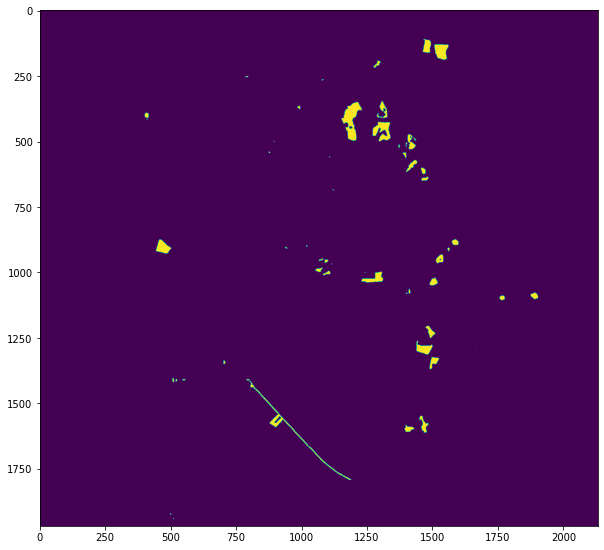

Dice =  0.8455252727895484


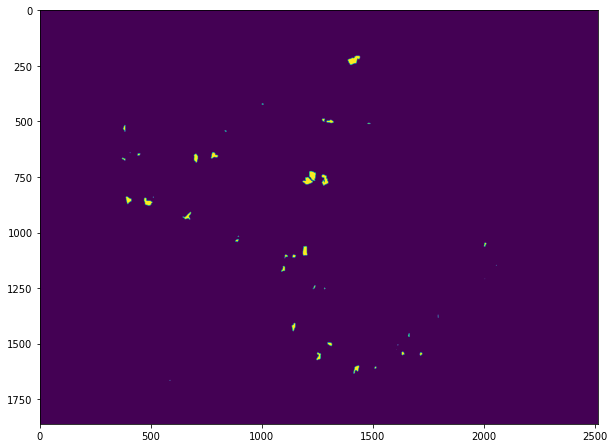

Dice =  0.8457111537407509


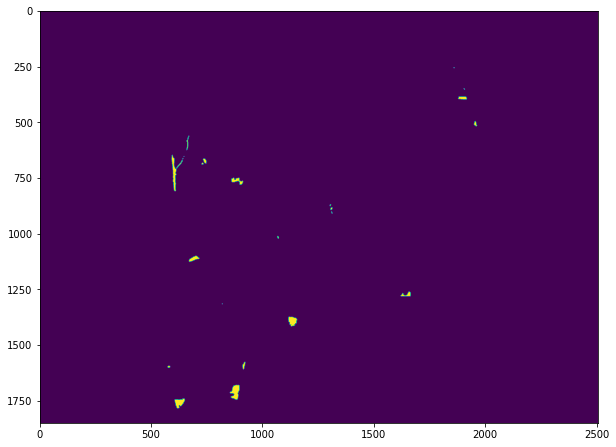

Dice =  0.8990767271569564


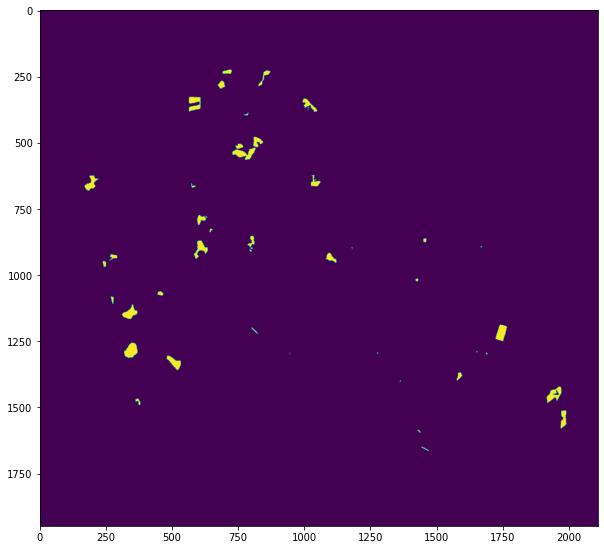

Dice =  0.7550223214285714


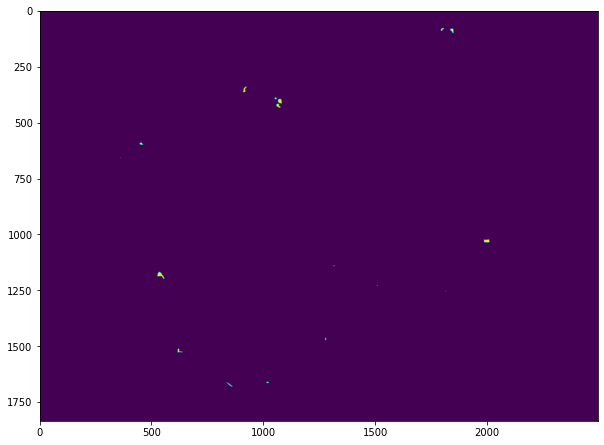

In [50]:
scores = []
for name in list(set(list_images) & set(list_masks)):
    two_images = gdal.Open(f'../input/roscosmos-rucode/Images_composit/Images_composit/8_ch/{name}', gdalconst.GA_ReadOnly)
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(1,4)])
    img_rgb_1 = np.moveaxis(channel_rgb1, 0, -1)/1024
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(5,8)])
    img_rgb_2 = np.moveaxis(channel_rgb1, 0, -1)/1024
    
    img_rgb_1 = (img_rgb_1 - [0,np.mean(img_rgb_1[:,:,1]),np.mean(img_rgb_1[:,:,2])])/[1,np.std(img_rgb_1[:,:,1]),np.std(img_rgb_1[:,:,2])]
    img_rgb_2 = (img_rgb_2 - [0,np.mean(img_rgb_2[:,:,1]),np.mean(img_rgb_2[:,:,2])])/[1,np.std(img_rgb_2[:,:,1]),np.std(img_rgb_2[:,:,2])]
    
    image = img_rgb_2 - img_rgb_1
    
    image = 0.299*image[:,:,0] + 0.587*image[:,:,1] + 0.114*image[:,:,2]
    
    image = (image - np.mean(image))/np.std(image)
    
    new_shape = (
        int(np.ceil(image.shape[0] / IMG_SIZE) * IMG_SIZE), 
        int(np.ceil(image.shape[1] / IMG_SIZE) * IMG_SIZE)
    )
    IMG_new = np.zeros(new_shape)
    res_mask = np.zeros(new_shape)
    
    IMG_new[:image.shape[0], :image.shape[1]] = image
    
    for i in range(0, new_shape[0], IMG_SIZE):
        for j in range(0, new_shape[1], IMG_SIZE):
            x_tensor = torch.Tensor(np.array([
                    IMG_new[i:i+IMG_SIZE, j:j+IMG_SIZE]
            ])).to(DEVICE).unsqueeze(0)
            pr_mask = tta_model_first(x_tensor).squeeze().detach().cpu().numpy()
            res_mask[i:i+IMG_SIZE, j:j+IMG_SIZE] = (pr_mask>=0.5).astype(int)
       
    res_mask = res_mask[:image.shape[0], :image.shape[1]]
    
    mask = gdal.Open(f'../input/roscosmos-rucode/mask/mask/{name}', gdalconst.GA_ReadOnly)
    gt = mask.GetRasterBand(1).ReadAsArray()
    seg = res_mask
    score = np.sum(seg[gt==1])*2.0 / (np.sum(seg) + np.sum(gt))
    scores.append(score)
    print("Dice = ",score)
    fig=plt.figure(figsize=(10, 15))
    plt.imshow(res_mask); plt.show()

In [51]:
np.mean(scores)

0.8434885156763589

In [ ]:
# class Dataset(BaseDataset):
#     def __init__(
#             self, 
#             images, 
#             masks, 
#             augmentation=None
#     ):
#         self.images = images
#         self.masks = masks
#         self.augmentation = augmentation
    
#     def __getitem__(self, i):
#         image = self.images[i]
#         mask = self.masks[i]
#         # apply augmentations
#         flag = np.random.rand() > 0.3
        
#         if self.augmentation:
#             sample = self.augmentation(image=image, mask=mask)
#             img, small_mask = sample['image'], sample['mask']
#             while small_mask.sum() == 0 and flag:
#                 sample = self.augmentation(image=image, mask=mask)
#                 img, small_mask = sample['image'], sample['mask']
        
        
#         return torch.tensor(np.moveaxis(img, -1, 0), dtype = torch.float), torch.tensor(np.array([small_mask]), dtype = torch.float)
        
#     def __len__(self):
#         return len(self.images)

In [ ]:
ENCODER = 'resnext50_32x4d'
ENCODER_WEIGHTS = 'imagenet'
ACTIVATION = 'sigmoid'
DEVICE = ('cuda' if torch.cuda.is_available() else 'cpu') 


model = smp.UnetPlusPlus(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS,
    in_channels=1,
    classes=1,
    activation=ACTIVATION,
)

In [ ]:
train_dataset = Dataset(
    array_of_images_s, 
    array_of_masks_s, 
    augmentation=get_training_augmentation()
)

train_loader = DataLoader(train_dataset, batch_size=20, shuffle=True, num_workers=12)
valid_loader = DataLoader(train_dataset, batch_size=20, shuffle=False, num_workers=12)

In [ ]:
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [ ]:
max_score = 5
max_metric_loss = 0
trash = 0
for i in range(0, 100):
    if trash > 8:
        break
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    
    if max_metric_loss<valid_logs['iou_score']:
        max_metric_loss = valid_logs['iou_score']
        torch.save(model, './best_model.pth')
        trash = 0
        print('Model saved!')
    else:
        trash +=1
        
    if i == 20:
        optimizer.param_groups[0]['lr'] = optimizer.param_groups[0]['lr']*0.6
        print('Decrease decoder learning rate to 1e-5!')

In [55]:
tta_model_second = tta.SegmentationTTAWrapper(torch.load('../input/extra-data/best_model.pth'), tta.aliases.d4_transform(), merge_mode='mean')

In [ ]:
for name in list(set(list_images) & set(list_masks)):
    two_images = gdal.Open(f'../input/roscosmos-rucode/Images_composit/Images_composit/8_ch/{name}', gdalconst.GA_ReadOnly)
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(1,4)])
    img_rgb_1 = np.moveaxis(channel_rgb1, 0, -1)
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(5,8)])
    img_rgb_2 = np.moveaxis(channel_rgb1, 0, -1)
    
    img1_norm = (img_rgb_1 - [np.mean(img_rgb_1[:,:,0]),np.mean(img_rgb_1[:,:,1]),np.mean(img_rgb_1[:,:,2])])/[np.std(img_rgb_1[:,:,0]),np.std(img_rgb_1[:,:,1]),np.std(img_rgb_1[:,:,2])]
    img2_norm = (img_rgb_2 - [np.mean(img_rgb_2[:,:,0]),np.mean(img_rgb_2[:,:,1]),np.mean(img_rgb_2[:,:,2])])/[np.std(img_rgb_2[:,:,0]),np.std(img_rgb_2[:,:,1]),np.std(img_rgb_2[:,:,2])]

    img1_gray = 0.299*img1_norm[:,:,0] + 0.587*img1_norm[:,:,1] + 0.114*img1_norm[:,:,2]
    img2_gray = 0.299*img2_norm[:,:,0] + 0.587*img2_norm[:,:,1] + 0.114*img2_norm[:,:,2]
    
    image = (img2_gray - img1_gray)
#     image = np.where(image>=0, image, np.zeros(image.shape))
    
    
    fig=plt.figure(figsize=(10, 15))
    plt.imshow(image); plt.show()

In [ ]:
scores = []
for name in list(set(list_images) & set(list_masks)):
    two_images = gdal.Open(f'../input/roscosmos-rucode/Images_composit/Images_composit/8_ch/{name}', gdalconst.GA_ReadOnly)
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(1,4)])
    img_rgb_1 = np.moveaxis(channel_rgb1, 0, -1)
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(5,8)])
    img_rgb_2 = np.moveaxis(channel_rgb1, 0, -1)
    
    img1_norm = (img_rgb_1 - [np.mean(img_rgb_1[:,:,0]),np.mean(img_rgb_1[:,:,1]),np.mean(img_rgb_1[:,:,2])])/[np.std(img_rgb_1[:,:,0]),np.std(img_rgb_1[:,:,1]),np.std(img_rgb_1[:,:,2])]
    img2_norm = (img_rgb_2 - [np.mean(img_rgb_2[:,:,0]),np.mean(img_rgb_2[:,:,1]),np.mean(img_rgb_2[:,:,2])])/[np.std(img_rgb_2[:,:,0]),np.std(img_rgb_2[:,:,1]),np.std(img_rgb_2[:,:,2])]
    
    image = (img2_norm - img1_norm)
    
    new_shape = (
        int(np.ceil(image.shape[0] / IMG_SIZE) * IMG_SIZE), 
        int(np.ceil(image.shape[1] / IMG_SIZE) * IMG_SIZE),
        3
    )
    IMG_new = np.zeros(new_shape)
    res_mask = np.zeros(new_shape)
    
    IMG_new[:image.shape[0], :image.shape[1]] = image
    
    for i in range(0, new_shape[0], IMG_SIZE):
        for j in range(0, new_shape[1], IMG_SIZE):
            x_tensor = torch.Tensor(np.moveaxis(IMG_new[i:i+IMG_SIZE, j:j+IMG_SIZE], -1, 0)).to(DEVICE).unsqueeze(0)
            pr_mask = tta_model_second(x_tensor).squeeze().detach().cpu().numpy()
            res_mask[i:i+IMG_SIZE, j:j+IMG_SIZE] = (pr_mask>0.4).astype(int)
       
    res_mask = res_mask[:image.shape[0], :image.shape[1]]
    
    mask = gdal.Open(f'../input/roscosmos-rucode/mask/mask/{name}', gdalconst.GA_ReadOnly)
    gt = mask.GetRasterBand(1).ReadAsArray()
    seg = res_mask
    score = np.sum(seg[gt==1])*2.0 / (np.sum(seg) + np.sum(gt))
    scores.append(score)
    print("Dice = ",score)
    fig=plt.figure(figsize=(10, 15))
    plt.imshow(res_mask); plt.show()

In [ ]:
np.mean(scores)

In [ ]:
list_new_images = []
list_new_masks = []
for name in [list_names_images[8], list_names_images[10], list_names_images[26]]:
    two_images = gdal.Open(f'../input/roscosmos-rucode/Images_composit/Images_composit/8_ch/{name}', gdalconst.GA_ReadOnly)
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(1,5)])
    img_rgb_1 = (np.moveaxis(channel_rgb1, 0, -1)/1024)
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(5,9)])
    img_rgb_2 = (np.moveaxis(channel_rgb1, 0, -1)/1024)
    img1_gray = 0.299*img_rgb_1[:,:,0] + 0.587*img_rgb_1[:,:,1] + 0.114*img_rgb_1[:,:,2]
    img2_gray = 0.299*img_rgb_2[:,:,0] + 0.587*img_rgb_2[:,:,1] + 0.114*img_rgb_2[:,:,2]
    
    img1_norm = (img1_gray - np.mean(img1_gray))/np.std(img1_gray)
    img2_norm = (img2_gray - np.mean(img2_gray))/np.std(img2_gray)

#     img1_norm = (img1_norm - np.min(img1_norm))/(np.max(img1_norm) - np.min(img1_norm))
#     img2_norm = (img2_norm - np.min(img2_norm))/(np.max(img2_norm) - np.min(img2_norm))

    image = (img2_norm - img1_norm)
#     sobelx = cv2.Sobel(image,cv2.CV_64F,0,1,ksize=5)
#     sobelx = (sobelx - np.mean(sobelx))/np.std(sobelx)
#     sobelx = (sobelx - np.min(sobelx))/(np.max(sobelx) - np.min(sobelx))
#     image += sobelx*2
    
    new_shape = (
        int(np.ceil(image.shape[0] / IMG_SIZE) * IMG_SIZE), 
        int(np.ceil(image.shape[1] / IMG_SIZE) * IMG_SIZE)
    )
    IMG_new = np.zeros(new_shape)
    res_mask = np.zeros(new_shape)
    
    IMG_new[:image.shape[0], :image.shape[1]] = image
    
    for i in range(0, new_shape[0], IMG_SIZE):
        for j in range(0, new_shape[1], IMG_SIZE):
            x_tensor = torch.Tensor(np.array([
                    IMG_new[i:i+IMG_SIZE, j:j+IMG_SIZE]
            ])).to(DEVICE).unsqueeze(0)
            pr_mask = (tta_model_first(x_tensor).squeeze().detach().cpu().numpy()>0.4).astype(int)
            res_mask[i:i+IMG_SIZE, j:j+IMG_SIZE] = pr_mask
       
    res_mask = res_mask[:image.shape[0], :image.shape[1]]
    
    IMG_first = np.zeros(new_shape)
    mask_first = np.zeros(new_shape)
    
    IMG_first[:img1_norm.shape[0], :img1_norm.shape[1]] = img1_norm
    
    for i in range(0, new_shape[0], IMG_SIZE):
        for j in range(0, new_shape[1], IMG_SIZE):
            x_tensor = torch.Tensor(np.array([
                    IMG_first[i:i+IMG_SIZE, j:j+IMG_SIZE]
            ])).to(DEVICE).unsqueeze(0)
            pr_mask = (tta_model_first(x_tensor).squeeze().detach().cpu().numpy()>0.4).astype(int)
            mask_first[i:i+IMG_SIZE, j:j+IMG_SIZE] = pr_mask
    
    mask_first = mask_first[:img1_norm.shape[0], :img1_norm.shape[1]]
    
    IMG_second = np.zeros(new_shape)
    mask_second = np.zeros(new_shape)
    
    IMG_second[:img1_norm.shape[0], :img1_norm.shape[1]] = img2_norm
    
    for i in range(0, new_shape[0], IMG_SIZE):
        for j in range(0, new_shape[1], IMG_SIZE):
            x_tensor = torch.Tensor(np.array([
                    IMG_second[i:i+IMG_SIZE, j:j+IMG_SIZE]
            ])).to(DEVICE).unsqueeze(0)
            pr_mask = (tta_model_first(x_tensor).squeeze().detach().cpu().numpy()>0.4).astype(int)
            mask_second[i:i+IMG_SIZE, j:j+IMG_SIZE] = pr_mask
    
    mask_second = mask_second[:img2_norm.shape[0], :img2_norm.shape[1]]
    
    mask_mul = mask_first*mask_second
    mask_mul = (mask_mul == 0).astype(int)
    
    res_mask = res_mask*mask_mul
    fig=plt.figure(figsize=(20, 25))
    fig.add_subplot(1, 2, 1)
    plt.imshow(res_mask)
    fig.add_subplot(1, 2, 2)
    plt.imshow(image)
    
    list_new_images.append(image)
    list_new_masks.append(res_mask)
    
    plt.show()

In [ ]:
list_new_images*=100
list_new_masks*=100

In [ ]:
array_of_images += list_new_images
array_of_masks += list_new_masks

In [ ]:
train_dataset = Dataset(
    array_of_images, 
    array_of_masks, 
    augmentation=get_training_augmentation()
)

# valid_dataset = Dataset(
#     X_test, 
#     y_test
# )

train_loader = DataLoader(train_dataset, batch_size=20, shuffle=True, num_workers=12)
valid_loader = DataLoader(train_dataset, batch_size=20, shuffle=False, num_workers=12)

In [ ]:
loss = smp.utils.base.SumOfLosses(
    smp.utils.losses.DiceLoss(),
    smp.utils.losses.BCELoss()
)

metrics = [
    smp.utils.metrics.IoU(threshold=0.5)
]

optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

In [ ]:
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [ ]:
max_score = 5
max_metric_loss = 0
trash = 0
for i in range(0, 100):
    if trash > 8:
        break
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    
    # do something (save model, change lr, etc.)
    if max_metric_loss<valid_logs['iou_score']:
        max_metric_loss = valid_logs['iou_score']
        torch.save(model, './best_model.pth')
        trash = 0
        print('Model saved!')
    else:
        trash +=1
        
    if i == 20:
        optimizer.param_groups[0]['lr'] = optimizer.param_groups[0]['lr']*0.6
        print('Decrease decoder learning rate to 1e-5!')

In [ ]:
tta_model_first = tta.SegmentationTTAWrapper(torch.load('../input/extra-data/best_model.pth'), tta.aliases.d4_transform(), merge_mode='mean')
# tta_model_second = tta.SegmentationTTAWrapper(torch.load('./best_model_1.pth'), tta.aliases.d4_transform(), merge_mode='mean')

In [ ]:
scores = []
for name in list(set(list_images) & set(list_masks)):
    two_images = gdal.Open(f'../input/roscosmos-rucode/Images_composit/Images_composit/8_ch/{name}', gdalconst.GA_ReadOnly)
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(1,5)])
    img_rgb_1 = (np.moveaxis(channel_rgb1, 0, -1)/1024)
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(5,9)])
    img_rgb_2 = (np.moveaxis(channel_rgb1, 0, -1)/1024)
    img1_gray = 0.299*img_rgb_1[:,:,0] + 0.587*img_rgb_1[:,:,1] + 0.114*img_rgb_1[:,:,2]
    img2_gray = 0.299*img_rgb_2[:,:,0] + 0.587*img_rgb_2[:,:,1] + 0.114*img_rgb_2[:,:,2]
    
    img1_norm = (img1_gray - np.mean(img1_gray))/np.std(img1_gray)
    img2_norm = (img2_gray - np.mean(img2_gray))/np.std(img2_gray)
    
#     img1_norm = (img1_norm - np.min(img1_norm))/(np.max(img1_norm) - np.min(img1_norm))
#     img2_norm = (img2_norm - np.min(img2_norm))/(np.max(img2_norm) - np.min(img2_norm))

    image = (img2_norm - img1_norm)
#     sobelx = cv2.Sobel(image,cv2.CV_64F,0,1,ksize=5)
#     sobelx = (sobelx - np.mean(sobelx))/np.std(sobelx)
#     sobelx = (sobelx - np.min(sobelx))/(np.max(sobelx) - np.min(sobelx))
#     image += sobelx*2
    
    new_shape = (
        int(np.ceil(image.shape[0] / IMG_SIZE) * IMG_SIZE), 
        int(np.ceil(image.shape[1] / IMG_SIZE) * IMG_SIZE)
    )
    IMG_new = np.zeros(new_shape)
    res_mask = np.zeros(new_shape)
    
    IMG_new[:image.shape[0], :image.shape[1]] = image
    
    for i in range(0, new_shape[0], IMG_SIZE):
        for j in range(0, new_shape[1], IMG_SIZE):
            x_tensor = torch.Tensor(np.array([
                    IMG_new[i:i+IMG_SIZE, j:j+IMG_SIZE]
            ])).to(DEVICE).unsqueeze(0)
            pr_mask = (tta_model_first(x_tensor).squeeze().detach().cpu().numpy()>0.4).astype(int)
            res_mask[i:i+IMG_SIZE, j:j+IMG_SIZE] = pr_mask
       
    res_mask = res_mask[:image.shape[0], :image.shape[1]]
    
    IMG_first = np.zeros(new_shape)
    mask_first = np.zeros(new_shape)
    
    IMG_first[:img1_norm.shape[0], :img1_norm.shape[1]] = img1_norm
    
    for i in range(0, new_shape[0], IMG_SIZE):
        for j in range(0, new_shape[1], IMG_SIZE):
            x_tensor = torch.Tensor(np.array([
                    IMG_first[i:i+IMG_SIZE, j:j+IMG_SIZE]
            ])).to(DEVICE).unsqueeze(0)
            pr_mask = (tta_model_first(x_tensor).squeeze().detach().cpu().numpy()>0.4).astype(int)
            mask_first[i:i+IMG_SIZE, j:j+IMG_SIZE] = pr_mask
    
    mask_first = mask_first[:img1_norm.shape[0], :img1_norm.shape[1]]
    
    IMG_second = np.zeros(new_shape)
    mask_second = np.zeros(new_shape)
    
    IMG_second[:img1_norm.shape[0], :img1_norm.shape[1]] = img2_norm
    
    for i in range(0, new_shape[0], IMG_SIZE):
        for j in range(0, new_shape[1], IMG_SIZE):
            x_tensor = torch.Tensor(np.array([
                    IMG_second[i:i+IMG_SIZE, j:j+IMG_SIZE]
            ])).to(DEVICE).unsqueeze(0)
            pr_mask = (tta_model_first(x_tensor).squeeze().detach().cpu().numpy()>0.4).astype(int)
            mask_second[i:i+IMG_SIZE, j:j+IMG_SIZE] = pr_mask
    
    mask_second = mask_second[:img2_norm.shape[0], :img2_norm.shape[1]]
    
    mask_mul = mask_first*mask_second
    mask_mul = (mask_mul == 0).astype(int)
    
    res_mask = res_mask*mask_mul
    mask = gdal.Open(f'../input/roscosmos-rucode/mask/mask/{name}', gdalconst.GA_ReadOnly)
    gt = mask.GetRasterBand(1).ReadAsArray()
    seg = res_mask
    score = np.sum(seg[gt==1])*2.0 / (np.sum(seg) + np.sum(gt))
    scores.append(score)
    print("Dice = ",score)
    fig=plt.figure(figsize=(10, 15))
    plt.imshow(res_mask); plt.show()

In [ ]:
np.mean(scores)

In [ ]:
image[500,700]

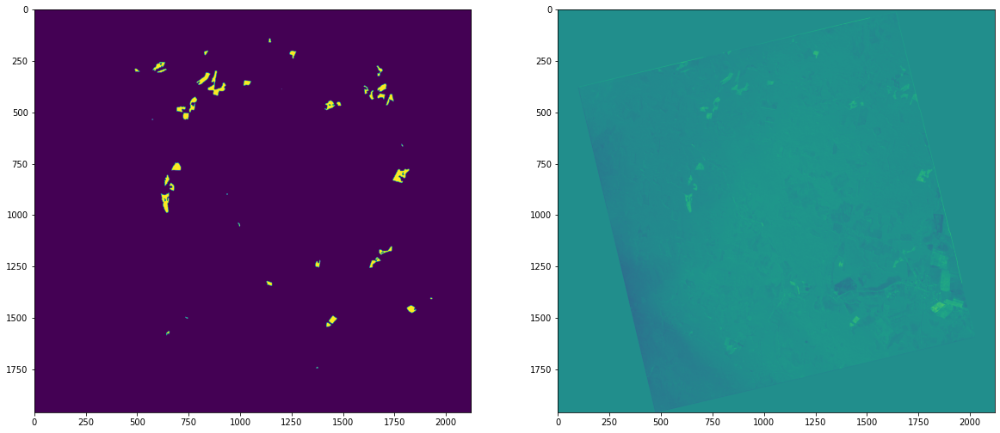

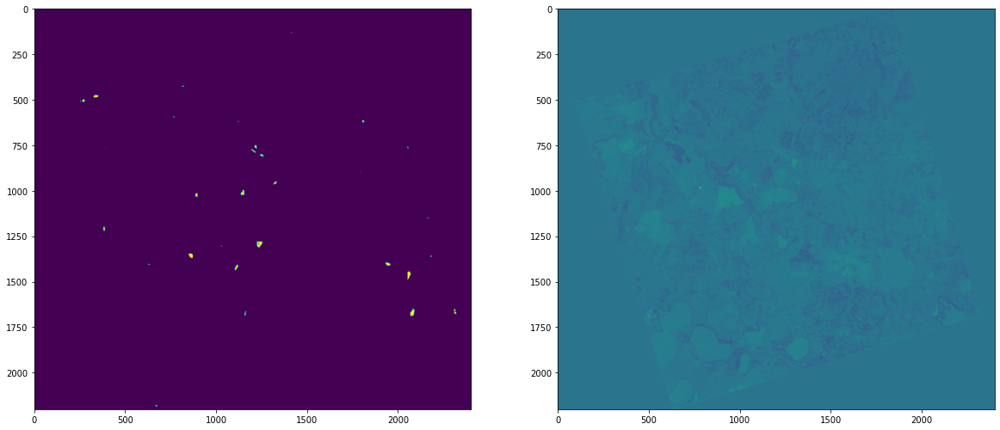

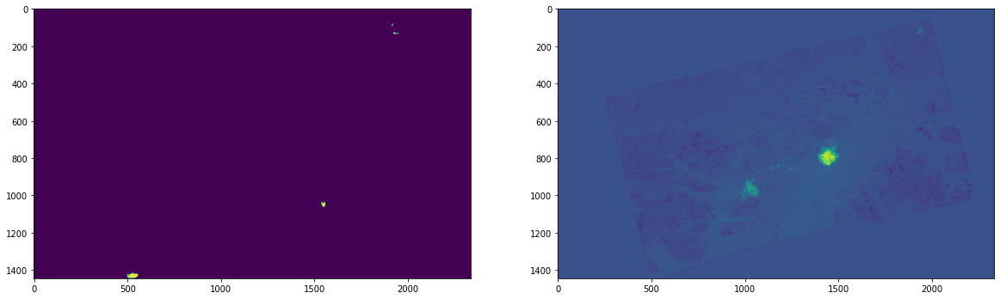

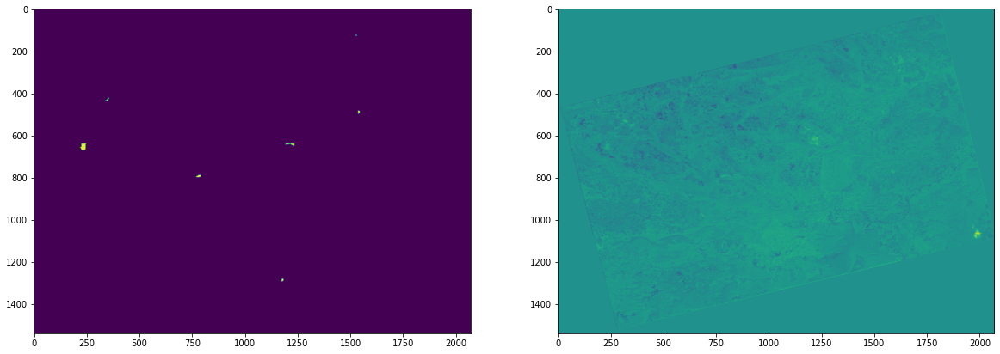

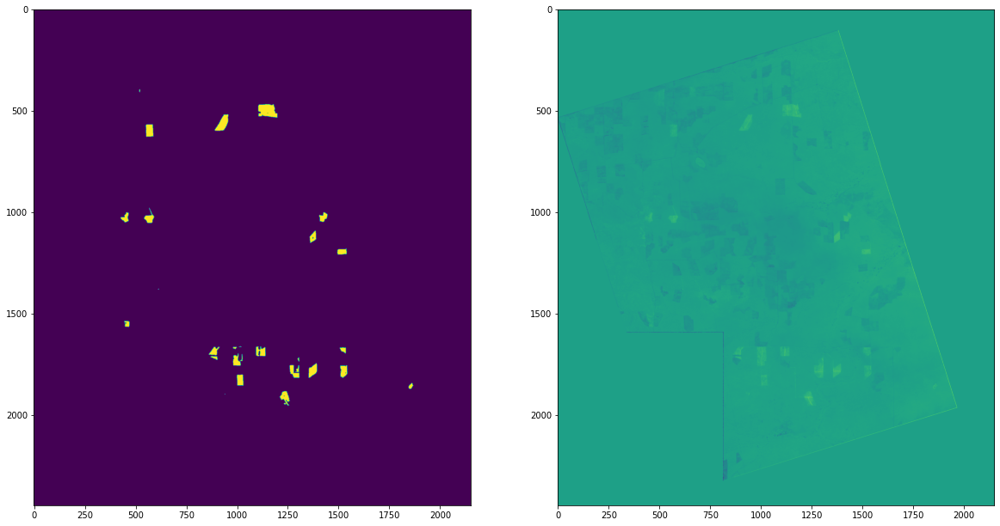

...

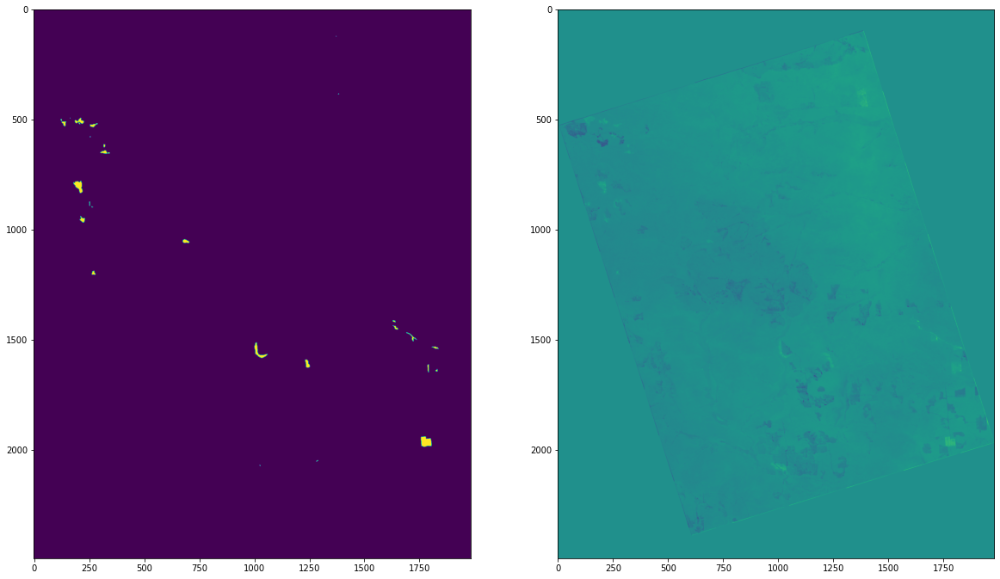

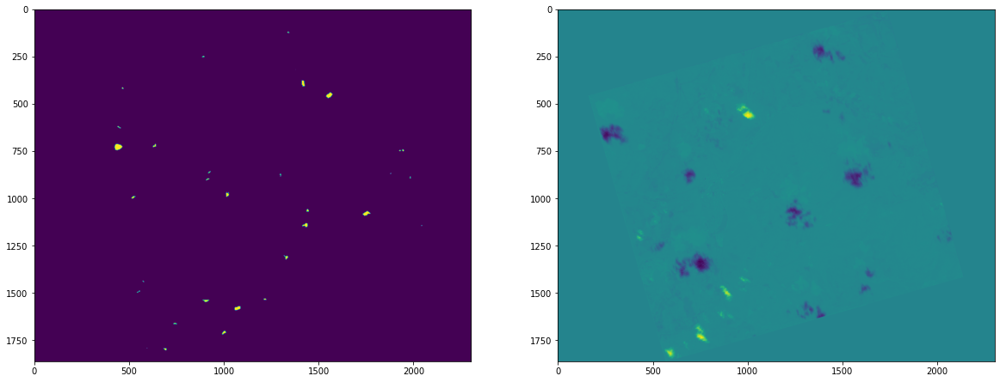

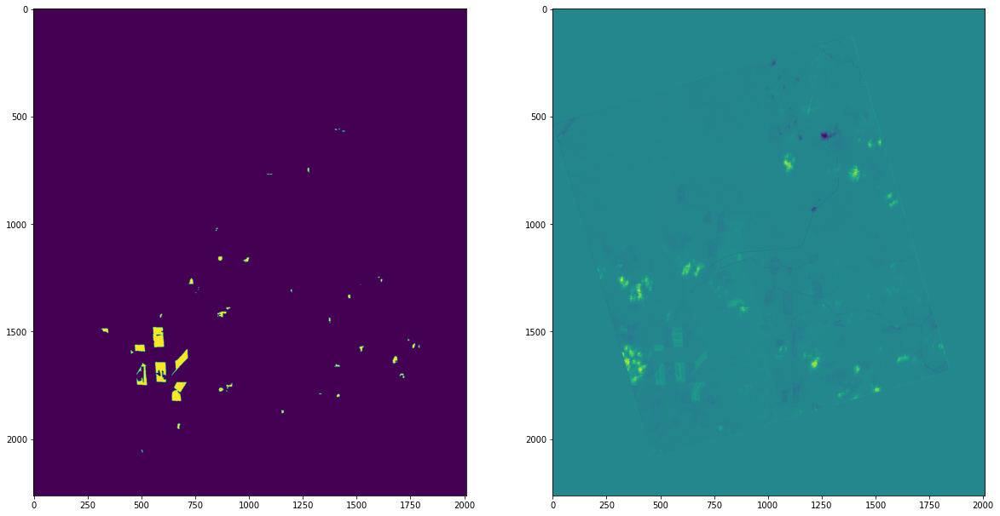

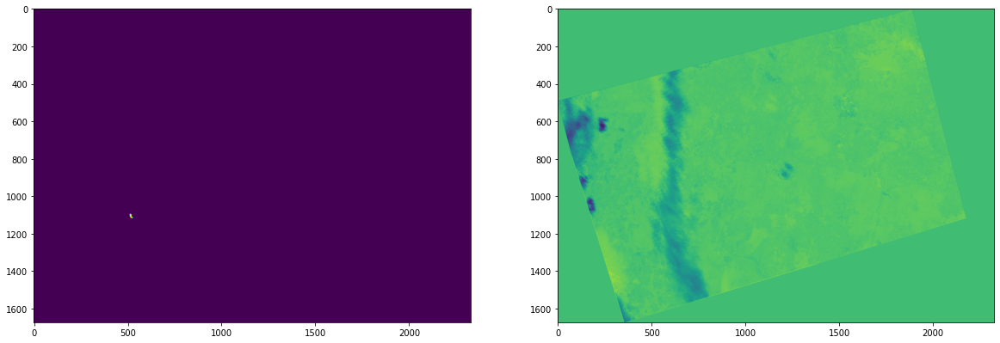

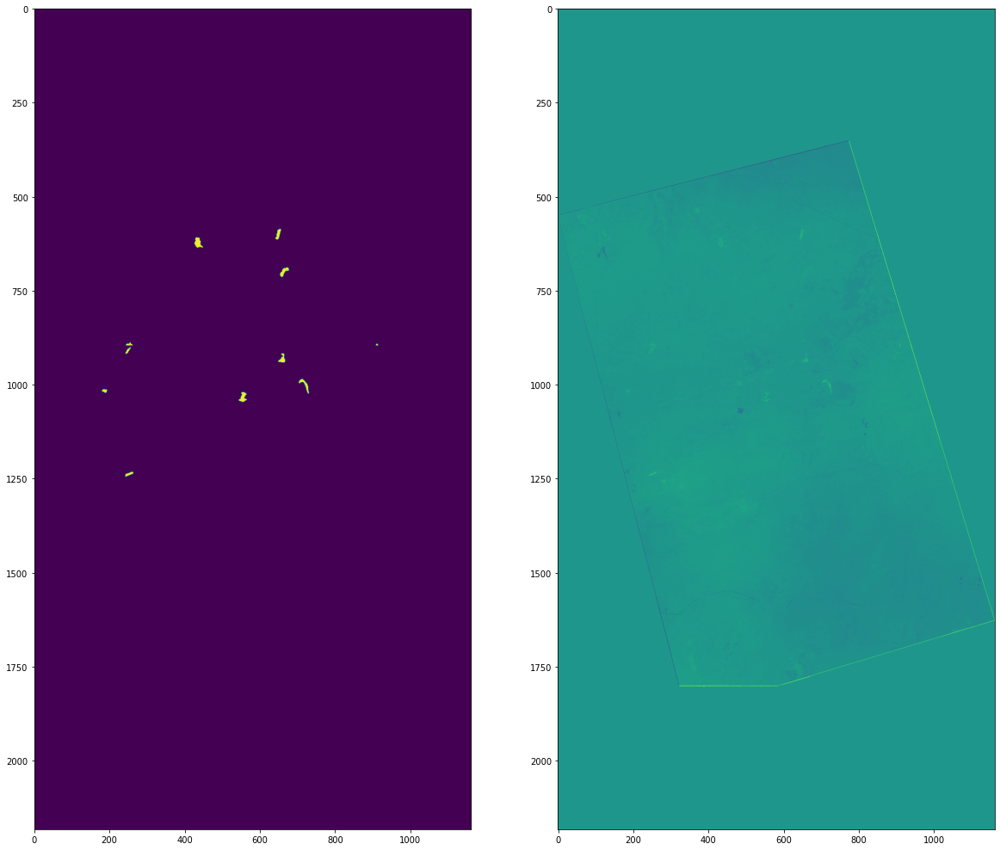

In [56]:
res = []
for name in list_names_images:
    two_images = gdal.Open(f'../input/roscosmos-rucode/Images_composit/Images_composit/8_ch/{name}', gdalconst.GA_ReadOnly)
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(1,4)])
    img_rgb_1 = np.moveaxis(channel_rgb1, 0, -1)/1024
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(5,8)])
    img_rgb_2 = np.moveaxis(channel_rgb1, 0, -1)/1024
    
    img_rgb_1 = (img_rgb_1 - [0,np.mean(img_rgb_1[:,:,1]),np.mean(img_rgb_1[:,:,2])])/[1,np.std(img_rgb_1[:,:,1]),np.std(img_rgb_1[:,:,2])]
    img_rgb_2 = (img_rgb_2 - [0,np.mean(img_rgb_2[:,:,1]),np.mean(img_rgb_2[:,:,2])])/[1,np.std(img_rgb_2[:,:,1]),np.std(img_rgb_2[:,:,2])]
    
    image = img_rgb_2 - img_rgb_1
    
    image = 0.299*image[:,:,0] + 0.587*image[:,:,1] + 0.114*image[:,:,2]
    
    image = (image - np.mean(image))/np.std(image)
    
    new_shape = (
        int(np.ceil(image.shape[0] / IMG_SIZE) * IMG_SIZE), 
        int(np.ceil(image.shape[1] / IMG_SIZE) * IMG_SIZE)
    )
    IMG_new = np.zeros(new_shape)
    res_mask = np.zeros(new_shape)
    
    IMG_new[:image.shape[0], :image.shape[1]] = image
    
    for i in range(0, new_shape[0], IMG_SIZE):
        for j in range(0, new_shape[1], IMG_SIZE):
            x_tensor = torch.Tensor(np.array([
                    IMG_new[i:i+IMG_SIZE, j:j+IMG_SIZE]
            ])).to(DEVICE).unsqueeze(0)
            pr_mask = tta_model_first(x_tensor).squeeze().detach().cpu().numpy()
            res_mask[i:i+IMG_SIZE, j:j+IMG_SIZE] = pr_mask
       
    res_mask = res_mask[:image.shape[0], :image.shape[1]]
    
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(1,5)])
    img_rgb_1 = (np.moveaxis(channel_rgb1, 0, -1)/1024)
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(5,9)])
    img_rgb_2 = (np.moveaxis(channel_rgb1, 0, -1)/1024)
    img1_gray = 0.299*img_rgb_1[:,:,0] + 0.587*img_rgb_1[:,:,1] + 0.114*img_rgb_1[:,:,2]
    img2_gray = 0.299*img_rgb_2[:,:,0] + 0.587*img_rgb_2[:,:,1] + 0.114*img_rgb_2[:,:,2]
    
    img1_norm = (img1_gray - np.mean(img1_gray))/np.std(img1_gray)
    img2_norm = (img2_gray - np.mean(img2_gray))/np.std(img2_gray)

    image = (img2_norm - img1_norm)
    
    new_shape = (
        int(np.ceil(image.shape[0] / IMG_SIZE) * IMG_SIZE), 
        int(np.ceil(image.shape[1] / IMG_SIZE) * IMG_SIZE)
    )
    IMG_new = np.zeros(new_shape)
    res_mask_best = np.zeros(new_shape)
    
    IMG_new[:image.shape[0], :image.shape[1]] = image
    
    for i in range(0, new_shape[0], IMG_SIZE):
        for j in range(0, new_shape[1], IMG_SIZE):
            x_tensor = torch.Tensor(np.array([
                    IMG_new[i:i+IMG_SIZE, j:j+IMG_SIZE]
            ])).to(DEVICE).unsqueeze(0)
            pr_mask = tta_model_second(x_tensor).squeeze().detach().cpu().numpy()
            res_mask_best[i:i+IMG_SIZE, j:j+IMG_SIZE] = pr_mask
       
    res_mask_best = res_mask_best[:image.shape[0], :image.shape[1]]
    res_mask = ((res_mask_best*0.6 + res_mask*0.4)>0.44).astype(int)
    fig=plt.figure(figsize=(20, 25))
    fig.add_subplot(1, 2, 1)
    plt.imshow(res_mask)
    fig.add_subplot(1, 2, 2)
    plt.imshow(image)
    
    plt.show()
    # res_mask = NDTS(NIR1, NIR2)
    # res_mask = NVDI(NIR1, NIR2, RED1, RED2)
    # res_mask = find_PCAKmeans(NIR1, NIR2)
    # res_mask = all_ones(NIR1, NIR2)
    df.loc[df.Id == name[:-4], 'mask'] = decode_mask(res_mask)
    res.append(decode_mask(res_mask))

In [ ]:
res = []
for name in list_names_images:
    two_images = gdal.Open(f'../input/roscosmos-rucode/Images_composit/Images_composit/8_ch/{name}', gdalconst.GA_ReadOnly)
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(1,5)])
    img_rgb_1 = (np.moveaxis(channel_rgb1, 0, -1)/1024)
    channel_rgb1 = np.stack([np.array(two_images.GetRasterBand(i).ReadAsArray()) for i in range(5,9)])
    img_rgb_2 = (np.moveaxis(channel_rgb1, 0, -1)/1024)
    img1_gray = 0.299*img_rgb_1[:,:,0] + 0.587*img_rgb_1[:,:,1] + 0.114*img_rgb_1[:,:,2]
    img2_gray = 0.299*img_rgb_2[:,:,0] + 0.587*img_rgb_2[:,:,1] + 0.114*img_rgb_2[:,:,2]
    
    img1_norm = (img1_gray - np.mean(img1_gray))/np.std(img1_gray)
    img2_norm = (img2_gray - np.mean(img2_gray))/np.std(img2_gray)

#     img1_norm = (img1_norm - np.min(img1_norm))/(np.max(img1_norm) - np.min(img1_norm))
#     img2_norm = (img2_norm - np.min(img2_norm))/(np.max(img2_norm) - np.min(img2_norm))

    image = (img2_norm - img1_norm)
#     sobelx = cv2.Sobel(image,cv2.CV_64F,0,1,ksize=5)
#     sobelx = (sobelx - np.mean(sobelx))/np.std(sobelx)
#     sobelx = (sobelx - np.min(sobelx))/(np.max(sobelx) - np.min(sobelx))
#     image += sobelx*2
    
    new_shape = (
        int(np.ceil(image.shape[0] / IMG_SIZE) * IMG_SIZE), 
        int(np.ceil(image.shape[1] / IMG_SIZE) * IMG_SIZE)
    )
    IMG_new = np.zeros(new_shape)
    res_mask = np.zeros(new_shape)
    
    IMG_new[:image.shape[0], :image.shape[1]] = image
    
    for i in range(0, new_shape[0], IMG_SIZE):
        for j in range(0, new_shape[1], IMG_SIZE):
            x_tensor = torch.Tensor(np.array([
                    IMG_new[i:i+IMG_SIZE, j:j+IMG_SIZE]
            ])).to(DEVICE).unsqueeze(0)
            pr_mask = (tta_model_first(x_tensor).squeeze().detach().cpu().numpy()>0.4).astype(int)
            res_mask[i:i+IMG_SIZE, j:j+IMG_SIZE] = pr_mask
       
    res_mask = res_mask[:image.shape[0], :image.shape[1]]
    fig=plt.figure(figsize=(20, 25))
    fig.add_subplot(1, 2, 1)
    plt.imshow(res_mask)
    fig.add_subplot(1, 2, 2)
    plt.imshow(image)
    
    plt.show()
    # res_mask = NDTS(NIR1, NIR2)
    # res_mask = NVDI(NIR1, NIR2, RED1, RED2)
    # res_mask = find_PCAKmeans(NIR1, NIR2)
    # res_mask = all_ones(NIR1, NIR2)
    df.loc[df.Id == name[:-4], 'mask'] = decode_mask(res_mask)
    res.append(decode_mask(res_mask))

In [ ]:
for i, name in enumerate(list_names_images):
    df.loc[df.Id == name[:-4], 'mask'] = res[i]

In [57]:
df.head()

,Id,mask
0,KVI_20180922_SCN3_UN91__KV1_20190804_SCN2_UN92,339458 1 340997 3 342537 4 344077 4 345617 7 3...
1,KV3_20180702_SCN2_UN47__KV4_20200829_SCN1_UN48,391774 2 393955 4 396137 6 398320 6 400502 7 4...
2,KVI_20180921_SCN9_UN89__KV4_20190622_SCN9_UN90,672604 2 675037 1 675041 2 677468 2 677473 3 6...
3,KV1_20180615_SCN9_UN39__KV3_20200522_SCN9_UN40,600185 2 602437 3 604690 3 606943 3 609196 3 6...
4,KV6_20190704_SCN2_UN57__KV5_20200521_SCN10_UN58,424027 2 425836 6 427646 7 429456 8 431268 7 4...


In [58]:
df.to_csv('sabmission.csv', index = False)